In [1]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image = mpimg.imread('camera_cal/calibration2.jpg')

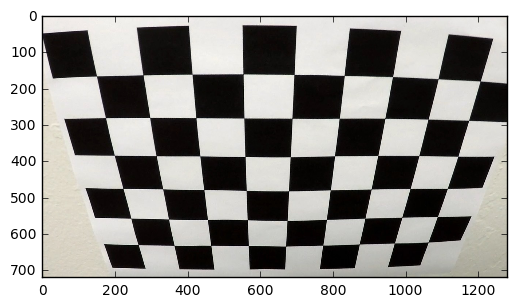

In [2]:
plt.imshow(image)
plt.show()

In [3]:
def cal_image_files():
  return glob.glob('camera_cal/*.jpg')
    
len(cal_image_files())

20

In [4]:
def find_corners(image, image_file, criteria, size):
  gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  ret, corners = cv2.findChessboardCorners(gray, size, None)
  if ret == False:
    print('Unable to find corners in image {}.'.format(image_file))
    return (False, None)
  else:
    # termination criteria
    corners2 = cv2.cornerSubPix(gray,corners, (11,11), (-1,-1),criteria)
    return (True, corners2)

size = (9,6)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
image_file = cal_image_files()[1]
image = mpimg.imread(image_file)
print(find_corners(image, image_file, criteria, size)[0])

True


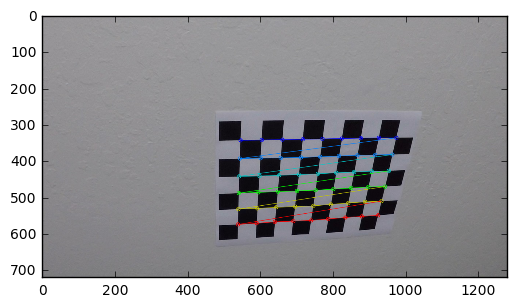

In [5]:
def show_corners(image, corners, ret, size):
  image = cv2.drawChessboardCorners(image, size, corners, ret)
  plt.imshow(image)
  plt.show()
  
image_file = cal_image_files()[1]
image = mpimg.imread(image_file)
ret, corners = find_corners(image, image_file, criteria, size)
show_corners(image, corners, ret, size)

In [6]:
def calibration_points(image_files, criteria, size):
  cols = size[0]
  rows = size[1]
  objp = np.zeros((cols*rows,3), np.float32)
  objp[:,:2] = np.mgrid[0:cols,0:rows].T.reshape(-1,2)

  # Arrays to store object points and image points from all the images.
  objpoints = [] # 3d point in real world space
  imgpoints = [] # 2d points in image plane.

  for image_file in image_files:
      image = mpimg.imread(image_file)
      ret, corners = find_corners(image, image_file, criteria, size)

      if ret == True:
          objpoints.append(objp)
          imgpoints.append(corners)
          
  return (objpoints, imgpoints)

len(calibration_points(cal_image_files(), criteria, size)[0])

Unable to find corners in image camera_cal/calibration1.jpg.
Unable to find corners in image camera_cal/calibration4.jpg.
Unable to find corners in image camera_cal/calibration5.jpg.


17

In [7]:
objpoints, imgpoints = calibration_points(cal_image_files(), criteria, size)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image.shape[0:2], None, None)

# M = cv2.getPerspectiveTransform(src, dst)
# Minv = cv2.getPerspectiveTransform(dst, src)
# warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

Unable to find corners in image camera_cal/calibration1.jpg.
Unable to find corners in image camera_cal/calibration4.jpg.
Unable to find corners in image camera_cal/calibration5.jpg.


Unable to find corners in image /Users/kyledorman/Documents/carnd/Advanced-Lane-Lines/camera_cal/calibration1.jpg.
Unable to find corners in image /Users/kyledorman/Documents/carnd/Advanced-Lane-Lines/camera_cal/calibration4.jpg.
Unable to find corners in image /Users/kyledorman/Documents/carnd/Advanced-Lane-Lines/camera_cal/calibration5.jpg.


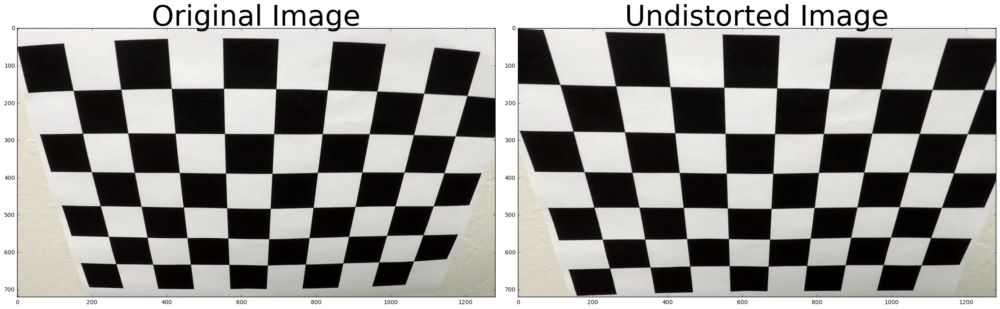

In [8]:
from lane_lines.PerspectiveTransformer import PerspectiveTransformer
from lane_lines.PerspectiveTransformer import ImageDistorter

distorter = ImageDistorter()
src = np.float32([(0, 0), (300, 0), (0, 300), (300, 300)])
image = mpimg.imread('camera_cal/calibration2.jpg')
shape = image.shape[0:2]
dst = np.float32([(0, 0), (shape[0], 0), (0, shape[1]), shape])
transformer = PerspectiveTransformer(image.shape, src, dst)
undistorted = distorter.undistort(image)
warped = transformer.warped(undistorted)



f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
# plt.savefig('calibrated_board.png')
plt.show()

[[[  20  700]]

 [[ 540  460]]

 [[ 730  460]]

 [[1280  700]]]


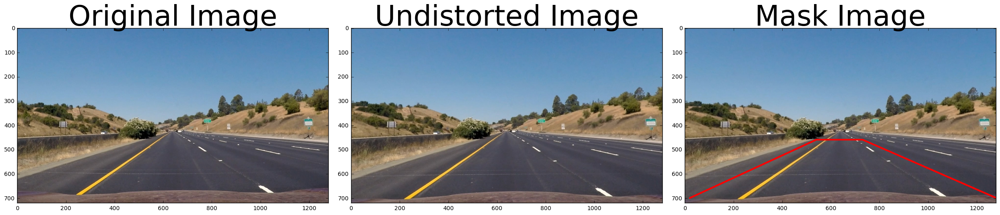

In [9]:
image = mpimg.imread('test_images/straight_lines1.jpg')
shape = image.shape[0:2]
undistorted = distorter.undistort(image)

src = [(20, 700), 
       (540, 460), 
       (730, 460),
       (1280, 700)]
mask = np.copy(undistorted)
pts = np.array([src[0], src[1],src[2],src[3]], np.int32)
pts = pts.reshape((-1,1,2))
print(pts)
cv2.polylines(mask,[pts],False,(255,0,0), 5)
# cv2.fillPoly(mask, np.int32([np.array(src)]), [255, 0, 0, 0.5])

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
ax3.imshow(mask)
ax3.set_title('Mask Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
# plt.savefig('image_mask.png')
plt.show()

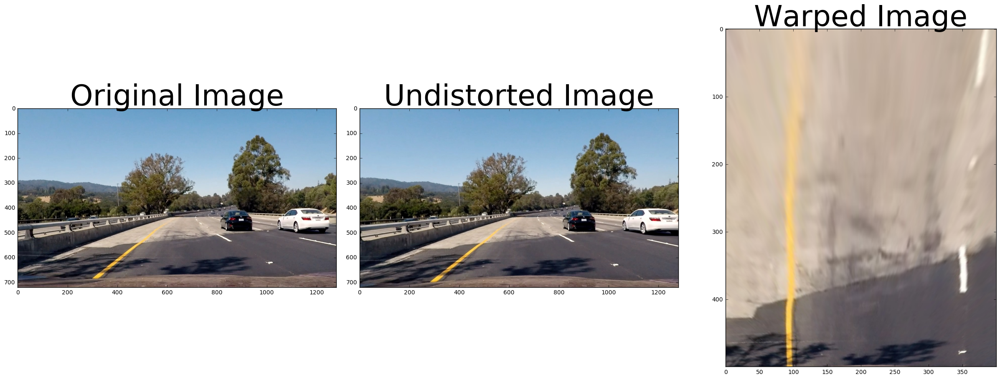

In [10]:
image = mpimg.imread('test_images/straight_lines1.jpg')
image = mpimg.imread('test_images/test4.jpg')
shape = image.shape[0:2]
undistorted = distorter.undistort(image)

src = np.float32([(546, 460), 
                  (737, 460),
                  (20, 680),
                  (1280, 680)])

dst = np.float32([(0, 0), 
                  (400, 0),
                  (0, 500),
                  (400, 500)])
transformer = PerspectiveTransformer(image.shape, src, dst)
warped = transformer.warped(undistorted)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
ax3.imshow(warped)
ax3.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
# plt.savefig('warped_road_curved.png')
plt.show()


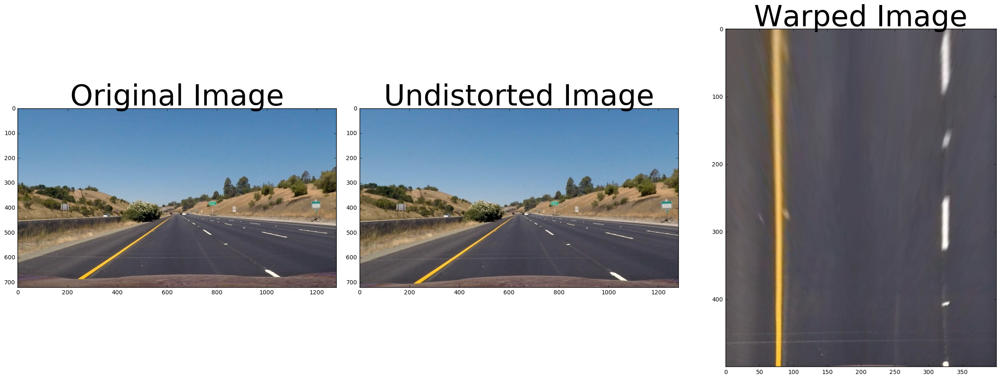

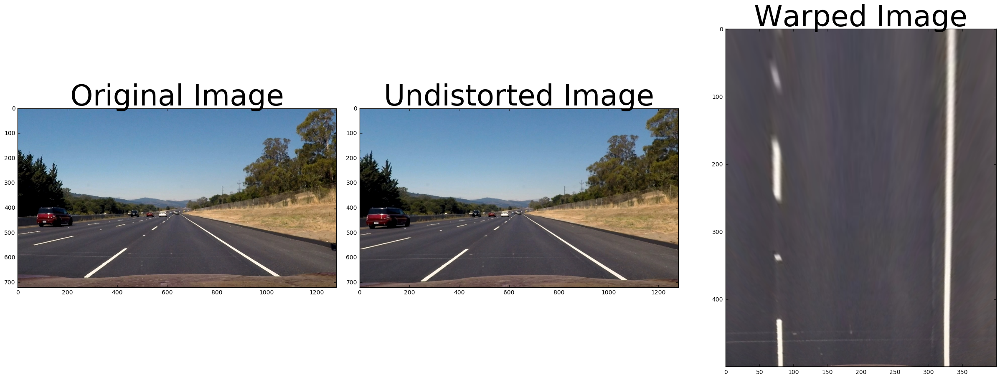

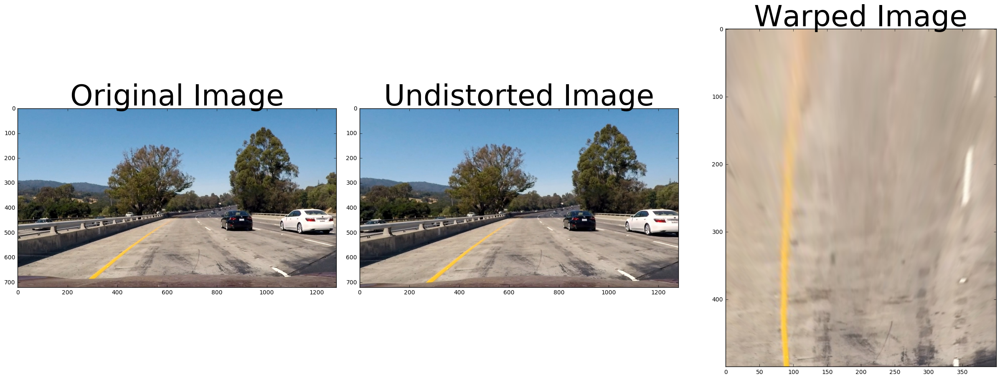

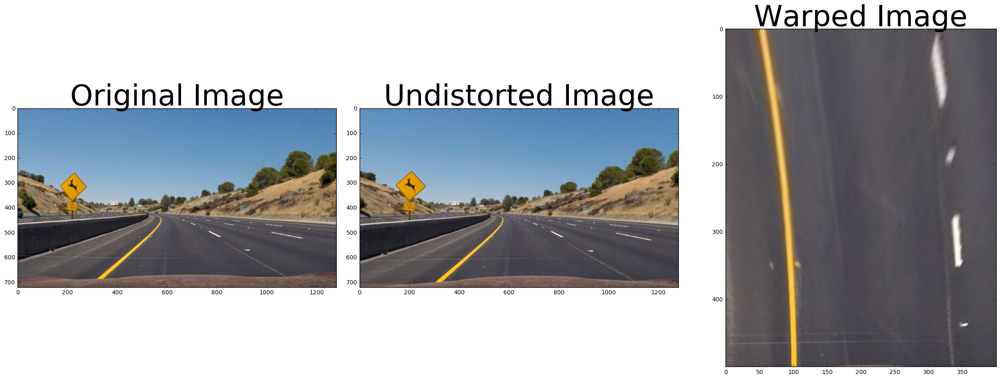

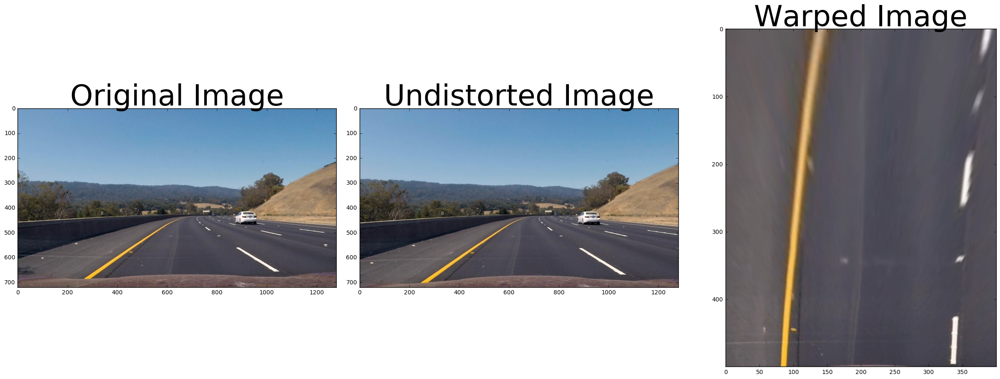

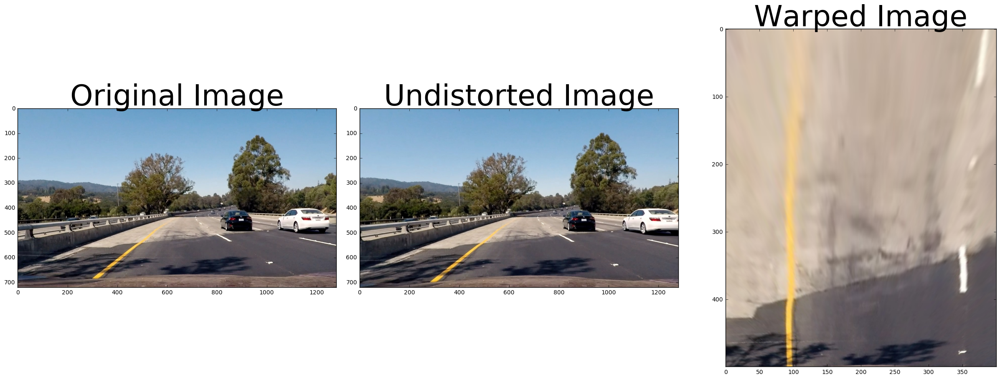

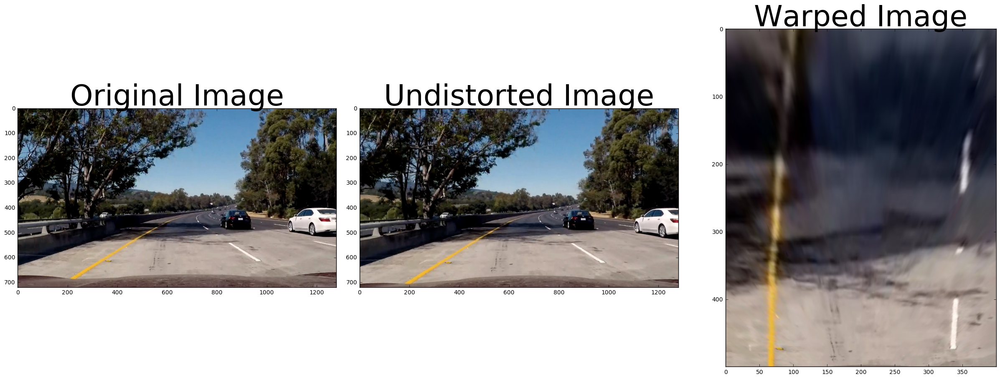

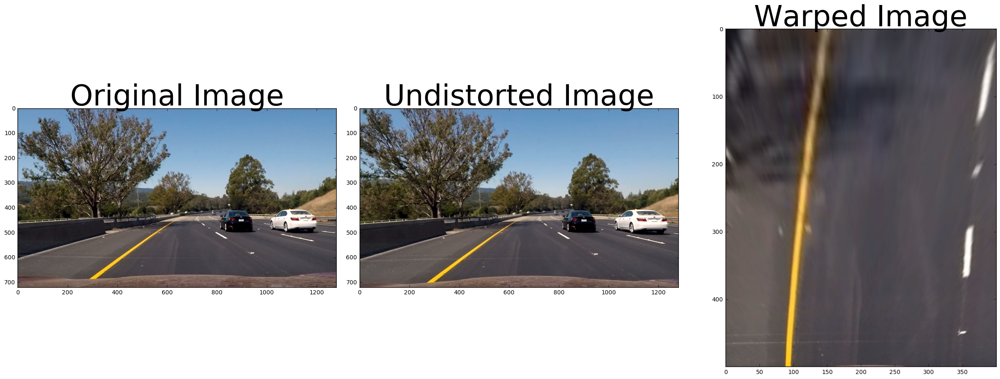

In [11]:
from lane_lines.PerspectiveTransformer import RoadTransformer

image_files = glob.glob("test_images/*.jpg")

for file in image_files:
  image = mpimg.imread(file)
  shape = image.shape[0:2]
  undistorted = distorter.undistort(image)

  transformer = RoadTransformer()
  warped = transformer.warped(undistorted)

  f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
  f.tight_layout()
  ax1.imshow(image)
  ax1.set_title('Original Image', fontsize=50)
  ax2.imshow(undistorted)
  ax2.set_title('Undistorted Image', fontsize=50)
  ax3.imshow(warped)
  ax3.set_title('Warped Image', fontsize=50)
  plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
  plt.show()